In [4]:
######## Packages ########
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.animation as animation 
from IPython.display import HTML
from scipy.integrate import solve_ivp 


In [5]:
class Lorenz():
    def __init__(self, sigma, r, b, maxtime, dt):
        self.sigma = sigma
        self.r = r 
        self.b = b 
        self.maxtime = maxtime
        self.dt = dt
    
    ######## dynamics ########
    def lorenz_dynamics(self, t, z):
        x = z 
        dynamics = np.empty(3)
        dynamics[0] = (-1)*self.sigma*(x[0] - x[1])
        dynamics[1] = (-1)*x[1] - x[0]*x[2] + self.r*x[0]
        dynamics[2] = x[0]*x[1] - self.b*x[2]
        return dynamics
    ##########################
    
    ######## solve ODE by scipy solver ########
    def rk_solver(self, x_init):
        sol = solve_ivp(fun=self.lorenz_dynamics, t_span=[0, self.maxtime], y0=x_init, method='RK45', dense_output=True, rtol=1e-6, atol=1e-10)
        t = np.linspace(0, self.maxtime, int(self.maxtime/self.dt)+1)
        z = sol.sol(t)
        return z
    ###########################################

In [10]:
######## parameter ########
sigma = 10; r = 28; b = 8/3
maxtime = 20; dt = 0.01
###########################

######## instance ########
lorenz = Lorenz(sigma=sigma, r=r, b=b, maxtime=maxtime, dt=dt)
##########################

######## solve ODE ########
x_init = np.array([0.0, 4.0, 28.0])
sol_z = lorenz.rk_solver(x_init=x_init)
###########################

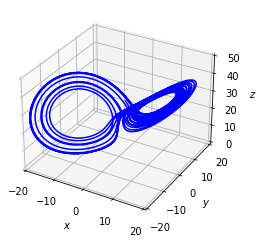

In [11]:
######## plot ########
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel(r"$x$"); ax.set_ylabel(r"$y$"); ax.set_zlabel(r"$z$")
ax.set_xlim([-20, 20]); ax.set_ylim([-20, 20]); ax.set_zlim([0, 50])
ax.plot(sol_z[0], sol_z[1], sol_z[2], c="b")
plt.show()

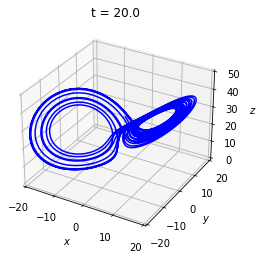

In [13]:
######## gif ########
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def update_func(frame):
    ax.clear()
    ax.set_xlabel(r"$x$"); ax.set_ylabel(r"$y$"); ax.set_zlabel(r"$z$")
    ax.set_xlim([-20, 20]); ax.set_ylim([-20, 20]); ax.set_zlim([0, 50])
    ax.set_title("t = {}".format(round(frame*dt, 2)))
    ax.plot(sol_z[0][:frame], sol_z[1][:frame], sol_z[2][:frame], c="b")

ani = animation.FuncAnimation(fig, update_func, frames = range(0, len(sol_z[0]), 5), interval=100)
ani.save("./3.7_lorenz.gif", writer="imagemagick")
HTML(ani.to_jshtml())
